# LB05: Кластеризация и снижение размерности

<div style="text-align: right"> ПСА 5 (Введение в машинное обучение). Мехмат, БГУ</div>
    
<div style="text-align: right"> Тишуров Алексей, 2021 </div>

Данный материал использует лицензию [Creative Commons CC BY-NC-SA 4.0.](https://creativecommons.org/licenses/by-nc-sa/4.0/) со всеми вытекающими. На прилагаемые к материалу датасеты лицензия не распространяется. 

В данной лабораторной работе вам предлагается познакомиться с методами кластеризации и понижения размерности. Для этого будем использовать 2 игрушечных датасета

1. Некоторые характеристики посетителей торгового центра
2. MNIST - легендарный и баянистый датасет фотографий рукописных цифр. 9 из 10 DS когда-либо классифицировали эти цифры (и вы тоже). В 2к19 по причинам, не поддающимся рациональному осмыслению, продолжает постоянно цитироваться и использоваться в публикациях по компьютерному зрению. А еще он подходит для ознакомления на практике с задачей кластеризации, чем мы и воспользуемся.


# Дополнительные материалы

1. https://habr.com/company/ods/blog/325654/ - про все
2. https://www.youtube.com/watch?v=oWRmzf9eI-c - про кластеризацию (сложно)
3. http://www.ccas.ru/voron/download/Clustering.pdf - про кластеризацию (сложно)
4. http://datareview.info/article/algoritm-t-sne-illyustrirovannyiy-vvodnyiy-kurs/ - про t-sne
5. https://habr.com/post/321216/ - еще про кластеризацию

+ Ссылки на демо из лекции

## Задание 0. Загрузка данных

In [1]:
from sklearn.datasets import load_digits

import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline 

import pandas as pd
import seaborn as sns

MNIST можно получить следующим образом. С датасетом вы уже знакомы, поэтому останавливаться подробно на разведочном анализе уже не будем.

In [2]:
mnist = load_digits()
print(mnist['DESCR'])
X_mnist = mnist['data']
y_mnist = mnist['target']

.. _digits_dataset:

Optical recognition of handwritten digits dataset
--------------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 1797
    :Number of Attributes: 64
    :Attribute Information: 8x8 image of integer pixels in the range 0..16.
    :Missing Attribute Values: None
    :Creator: E. Alpaydin (alpaydin '@' boun.edu.tr)
    :Date: July; 1998

This is a copy of the test set of the UCI ML hand-written digits datasets
https://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits

The data set contains images of hand-written digits: 10 classes where
each class refers to a digit.

Preprocessing programs made available by NIST were used to extract
normalized bitmaps of handwritten digits from a preprinted form. From a
total of 43 people, 30 contributed to the training set and different 13
to the test set. 32x32 bitmaps are divided into nonoverlapping blocks of
4x4 and the number of on pixels are counted in each blo

А вот датасет клиентов торгового центра для вас новый. Давайте на нем ненадолго остановимся. В нем всего 4 столбца с признаками:
1. Пол
2. Возраст
3. Годовой доход
4. Spending Score (1-100). Некая числовая характеристика трат человека на основе данных, которые на напрямую недоступны.

Проведите этому датасету базовый набор анализов и продемонстрируйте результаты. 

In [3]:
customers = pd.read_csv('customers.csv')

In [4]:
customers.head()

,CustomerID,Gender,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


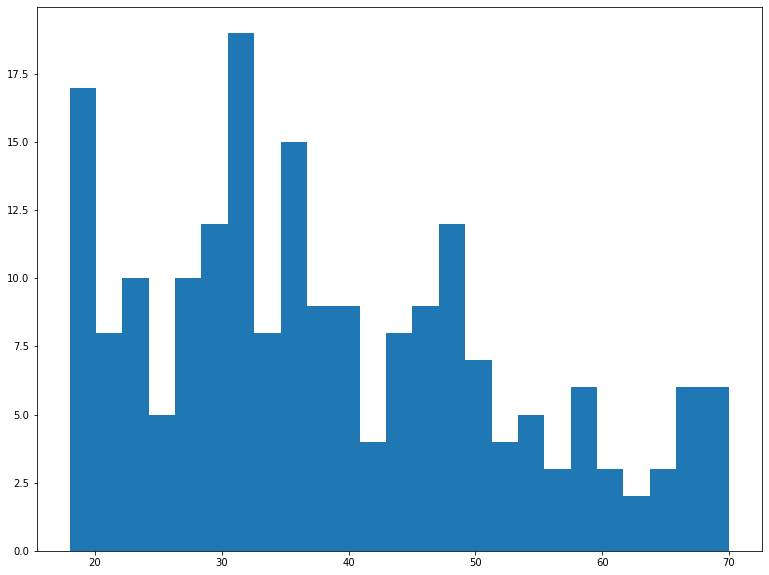

In [5]:
plt.figure(figsize=(13, 10))
plt.hist(customers['Age'], bins=25)
plt.show()

In [6]:
customers.drop('CustomerID', axis=1).corr()

,Age,Annual Income (k$),Spending Score (1-100)
Age,1.000000,-0.012398,-0.327227
Annual Income (k$),-0.012398,1.000000,0.009903
Spending Score (1-100),-0.327227,0.009903,1.000000


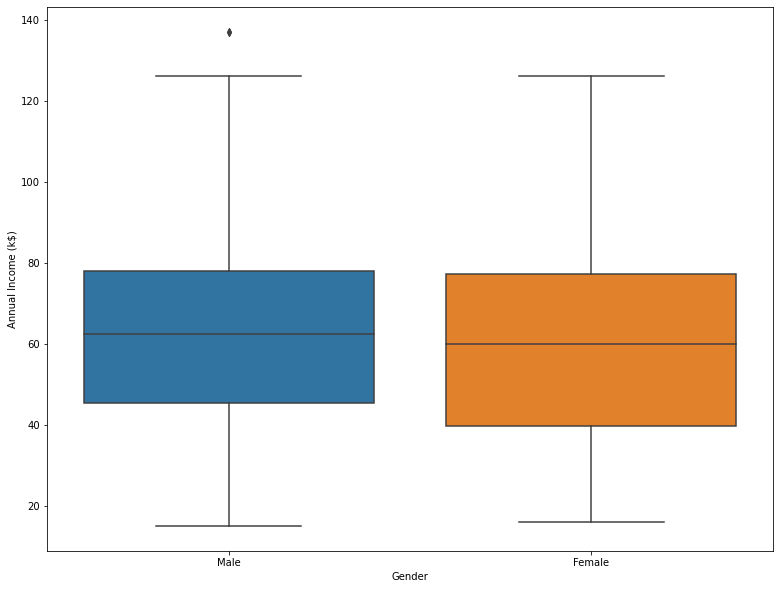

In [7]:
plt.figure(figsize=(13, 10))
sns.boxplot(x=customers['Gender'], y=customers['Annual Income (k$)'])
plt.show()

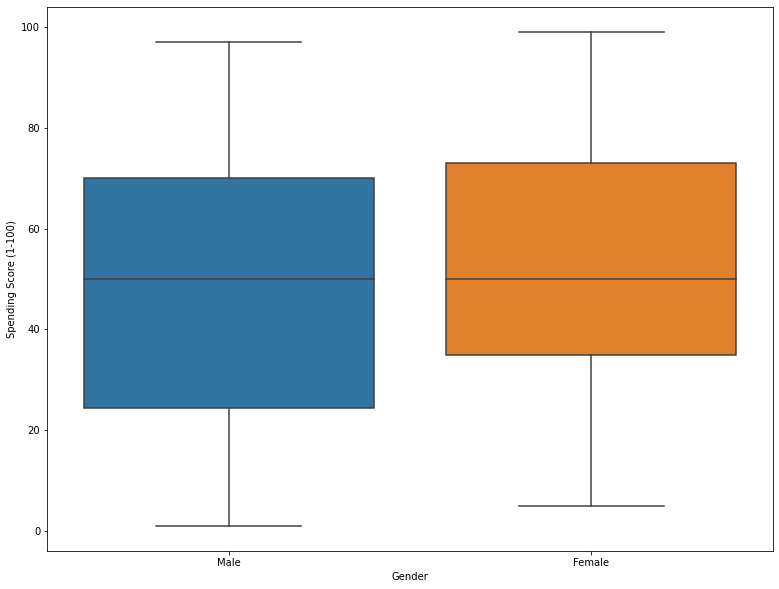

In [8]:
plt.figure(figsize=(13, 10))
sns.boxplot(x=customers['Gender'], y=customers['Spending Score (1-100)'])
plt.show()

## Статистика Хопкинса

На лекции мы с вами уже обсуждали эту статистику. Имплементировать ее я вас не прошу, поэтому предоставляю готовую функцию. Ниже ссылки на теоретические материалы для тех, кому захочется разобраться еще подробнее.

1. http://www.sthda.com/english/wiki/assessing-clustering-tendency-a-vital-issue-unsupervised-machine-learning
2. http://datascience.stackexchange.com/questions/14142/cluster-tendency-using-hopkins-statistic-implementation-in-python
во второй ссылке есть указание публикации Validating Clusters using the Hopkins Statistic from IEEE 2004, которую тоже можно найти при желании.

In [9]:
import numpy as np

from sklearn import datasets
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

Вот эта функция реализует вычисление статистики Хопкинса.
Это исправленная версия кода, представленного на stackoverflow. Для быстрого поиска ближайших соседей используется [k-мерное дерево](https://ru.wikipedia.org/wiki/K-d_дерево).



In [10]:
def hopkins_statistic(X, m_fraction=1):
    d = X.shape[1]
    n = X.shape[0]
    m = int(m_fraction * n)
    X_scaled = StandardScaler().fit_transform(X)
    X_sample = X_scaled[np.random.choice(range(0, n), m, replace=False)]
    neighbors = NearestNeighbors(n_neighbors=1, algorithm='kd_tree').fit(X_scaled)
    Y_rand = np.random.uniform(-1, 1, size=(m, d))
    y = []
    x = []
    for j in range(0, m):
        y.append(neighbors.kneighbors(Y_rand[j].reshape(1, -1),
                                      n_neighbors=1,
                                      return_distance=True)[0][0][0])
        x.append(neighbors.kneighbors(X_sample[j].reshape(1, -1),
                                      n_neighbors=2,
                                      return_distance=True)[0][0][1])

    H = sum(y) / (sum(x) + sum(y))
    return 1 - H

In [11]:
blobs, y = datasets.make_blobs(n_samples=5000, n_features=2,
                               centers=[(-10, -10), (0, 0), (10, 0)])
uni = np.random.uniform(-1,1, size=(5000, 2))

1. Чем ближе к 0, тем более выраженная кластерная структура (значение меньше 0.25 означает 90% вероятность наличия кластерной структуры)
2. Чем ближе к 0.5, тем больше данные похожи на шум
3. Если статистика близка к единице, то в данных есть какая-то структура, но не кластерная

In [12]:
print(hopkins_statistic(blobs, 0.1))
print(hopkins_statistic(uni, 0.1))

0.025315279482029607
0.486044479037108


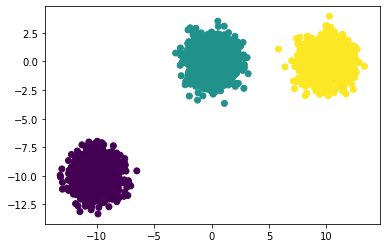

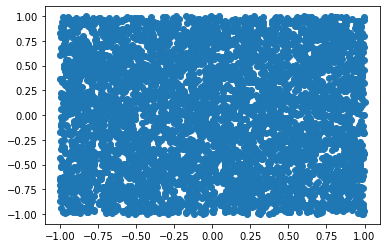

In [13]:
# Обратите внимание, каким образом я нарисовал кластеры разными цветами.
# Используйте этот способ дальше по лабе
plt.scatter(blobs[:,0], blobs[:,1], c=y)
plt.show()
plt.scatter(uni[:,0], uni[:,1])

# Часть 1. Кластеризация

Во втором датасете известно априорно оптимальное (оптимальное ли оно апостериорно, вам предстоит узнать) число кластеров: раз цифр 10, то логично предположить, что и кластеров будет 10. Поэтому будет проще, однако вам будет предложено посмотреть на результаты кластеризации и при другом числе кластеров и сделать выводы. 

Число кластеров для датасета покупателей неизвестно. Вам предстоит его выяснить на основе, например, анализа силуэтов.

## Задание предварительное. Оценка наличия кластерной структуры

С помощью функции для вычисления статистики Хопкинса проверьте датасеты на наличие кластерной структуры. Сделайте выводы и будьте готовы отвечать на вопросы о сути статистики.

P.s. Не надо волноваться, если значения статистики будут не самыми крутыми.


In [14]:
customers['Gender'] = customers['Gender'].apply(lambda x: 1 if x == 'Male' else 0)

In [15]:
print(hopkins_statistic(customers, 1))
print(hopkins_statistic(X_mnist, 1))

0.2919565213491946
0.38446995087461355


## Задание 1.1. Кластеризация методом k-средних

С помощью метода k-средних проведите кластеризацию на датасетах. Сначала зафиксируем число кластеров как 2 (для покупателей) и 10 (для цифр).

Поскольку для методов кластеризации не нужны реальные метки, вместо fit и predict у методов кластеризации реализована сразу функция fit_predict. Т.е. predicted_labels = kmeans.fit_predict(X_scaled).

X_scaled потому что данные вам нужно перед кластеризацией стандартизировать.

In [16]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples, homogeneity_score

In [17]:
cust_scaler = StandardScaler()
customers.loc[:, ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']] = \
    cust_scaler.fit_transform(
        customers.loc[:, ['Age', 'Annual Income (k$)', 'Spending Score (1-100)']])
customers.drop('CustomerID', axis=1, inplace=True)

In [18]:
mnist_scaler = StandardScaler()
X_mnist = mnist_scaler.fit_transform(X_mnist)

In [19]:
mnist_clust = KMeans(n_clusters=10, random_state=42)
y_pred_mnist = mnist_clust.fit_predict(X_mnist)

cust_clust = KMeans(n_clusters=2, random_state=42)
y_pred_cust = cust_clust.fit_predict(customers)

Ваша задача - провести кластеризацию и измерить метрики качества. Будем считать коэффициент силуэта и индекс гомогенности(второй только для цифр).

Также нужно отрисовать график силуэтов. Пример того, как это сделать в sklearn дан вот тут:

https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py


Очень надеюсь, что вы оформите повторяющиеся куски кода в функции, а не будете их копировать из одного места в другое.

In [20]:
def plot_silhouette(X, n_clusters, y_true=None):
    plt.figure(figsize=(13, 10))

    plt.xlim([-0.1, 1])
    plt.ylim([0, len(X) + (n_clusters + 1) * 10])

    clust = KMeans(n_clusters=n_clusters, random_state=42)
    y_pred = clust.fit_predict(X)

    sample_silhouette_values = silhouette_samples(X, y_pred)

    silhouette_avg = np.mean(sample_silhouette_values)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[y_pred == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    if y_true is not None:
        plt.title(f'The silhouette plot for {n_clusters} clusters.' + 
            f'\n Homogeneity index for MNIST ({n_clusters} clusters): ' +
             f'{round(homogeneity_score(y_true, y_pred), 4)}')
    else:
        plt.title(f'The silhouette plot for {n_clusters} clusters.')

    plt.xlabel('The silhouette coefficient values')
    plt.ylabel('Cluster label')

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color='red', linestyle='--')

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.show()

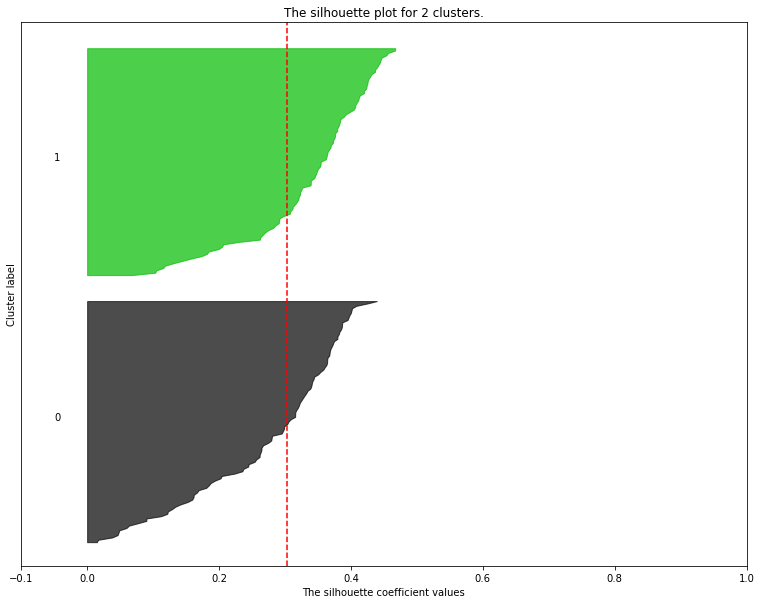

In [21]:
plot_silhouette(customers, 2)

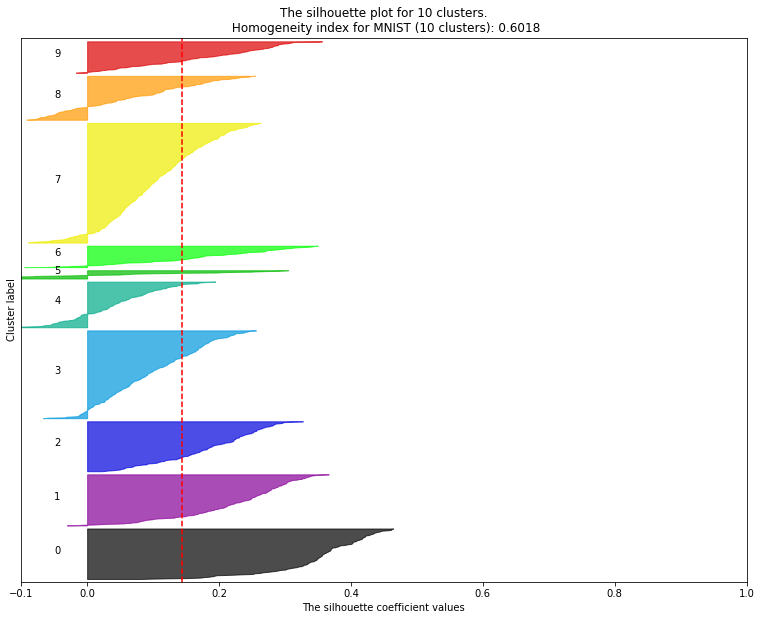

In [22]:
plot_silhouette(X_mnist, 10, y_mnist)

Давайте теперь попробуем забыть о метках и том, что их 10. В цикле сделайте кластеризацию с количеством кластеров от 5 до 15. В каждом случае нарисуйте графики силуэтов и напечатайте средний силуэт. Сделайте вывод о наилучшем числе кластеров в данной задаче.


Аналогичным образом попробуйте обнаружить оптимальное число кластеров для покупателей.

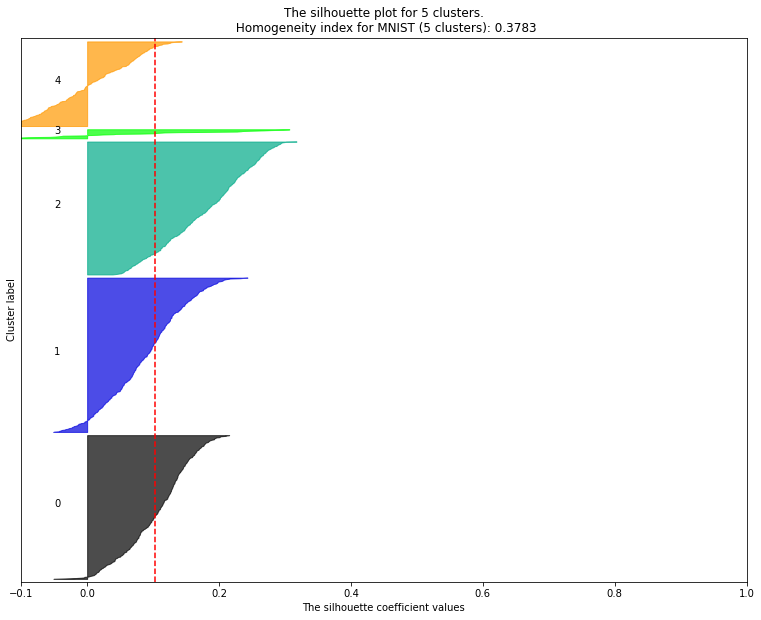

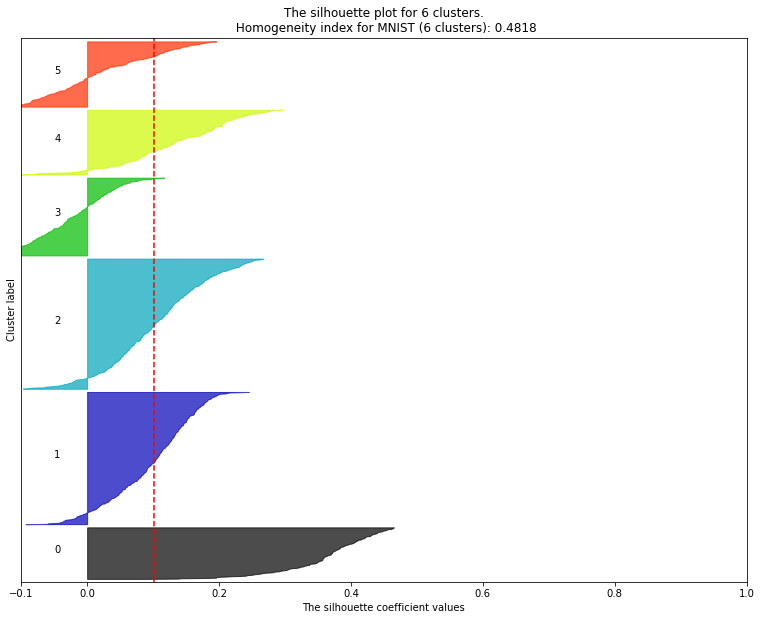

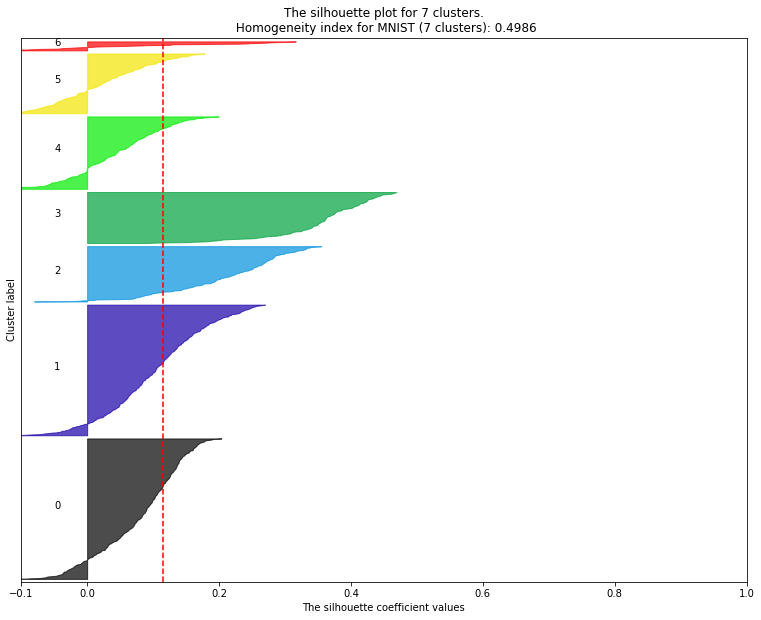

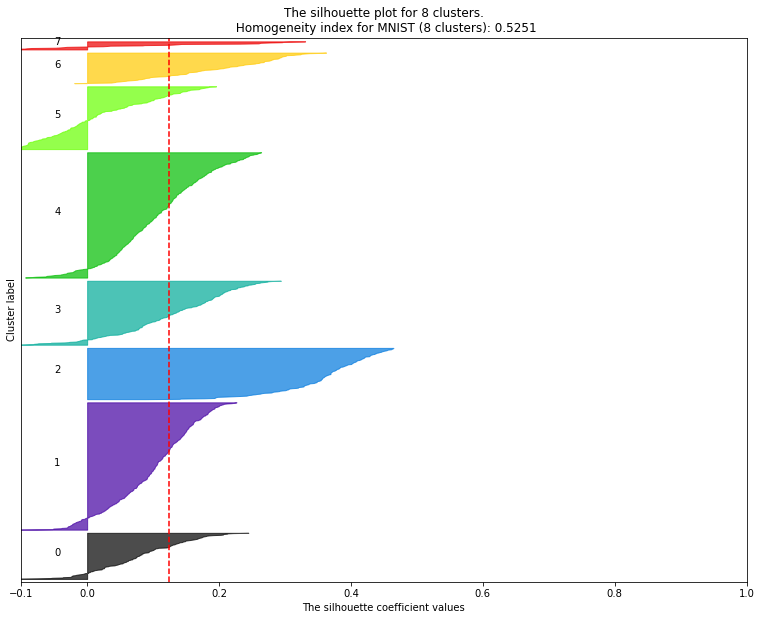

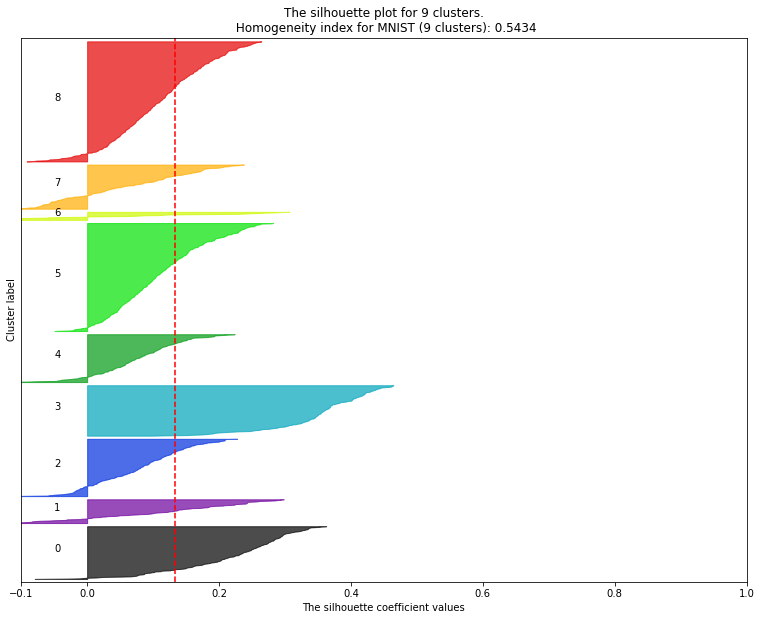

...

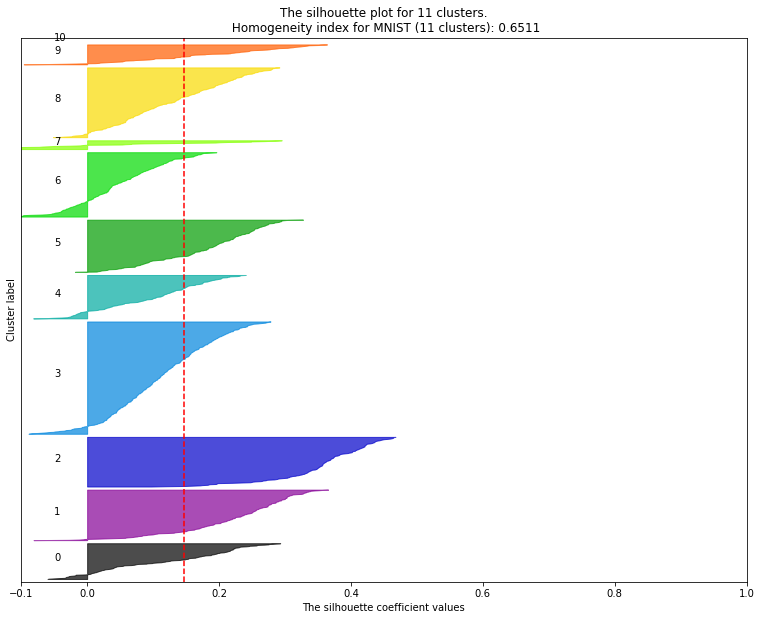

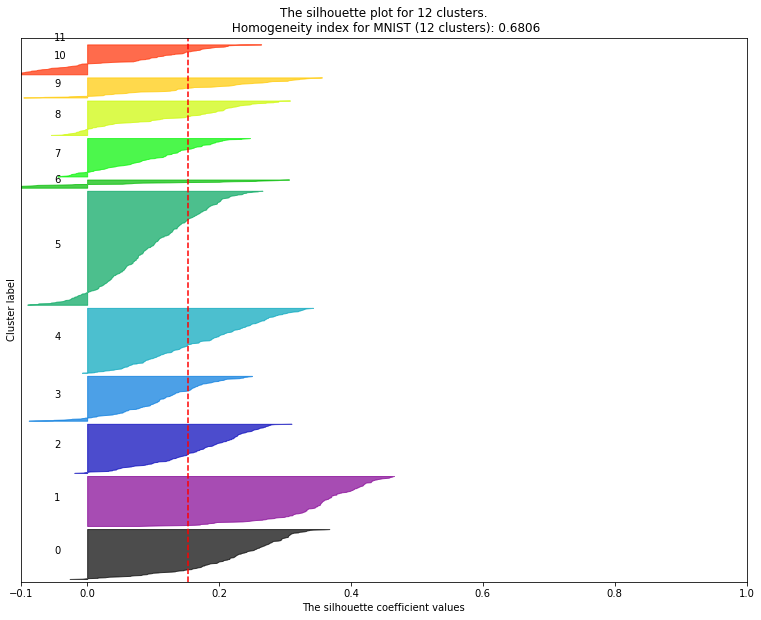

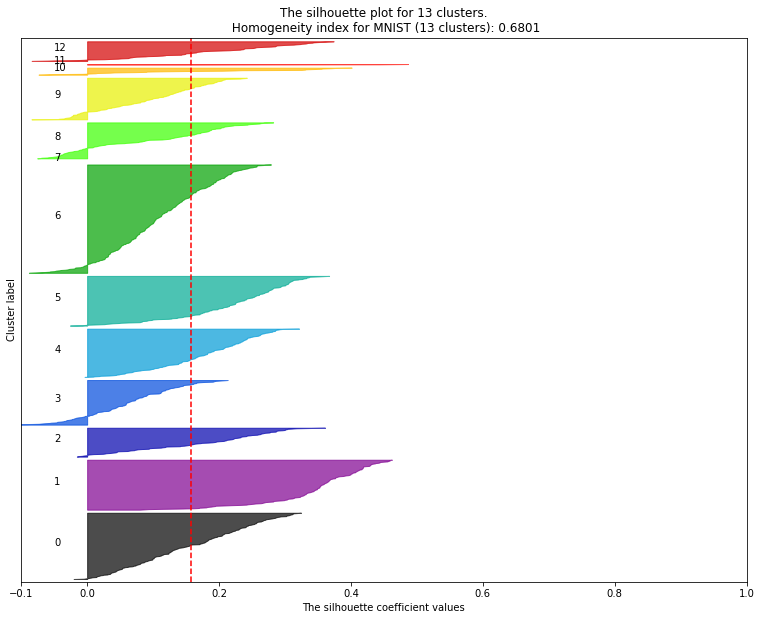

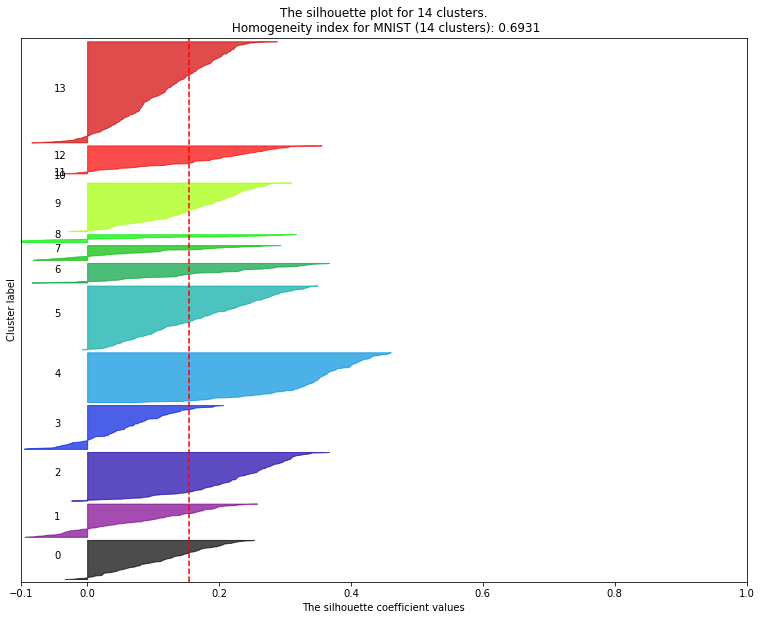

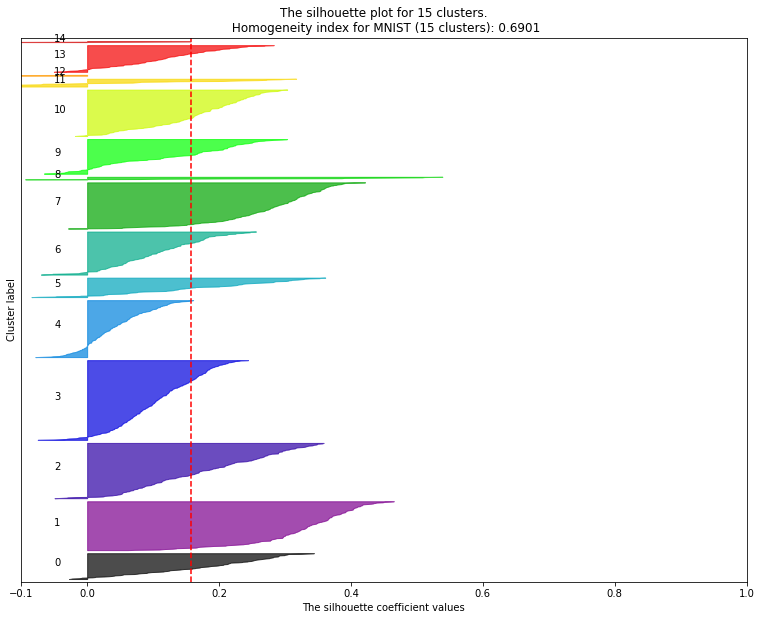

In [23]:
for n_clust in range(5, 16):
    plot_silhouette(X_mnist, n_clust, y_mnist)

## Задание 1.2 Алгомеративная иерархическая кластеризация

Кластеризация другая, а задача та же. Обучите, посчитайте, сравните, сделайте выводы. Вперед!

Считаем, что используем расстояние Уорда, но вы вольны использовать другое.


In [24]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

Нарисуйте и проанализируйте дендрограмму кластеризации. Пример того, как этом можно сделать:

https://github.com/scikit-learn/scikit-learn/blob/70cf4a676caa2d2dad2e3f6e4478d64bcb0506f7/examples/cluster/plot_hierarchical_clustering_dendrogram.py

In [25]:
def plot_dendrogram(model):
    children = model.children_

    distance = np.arange(children.shape[0])

    no_of_observations = np.arange(2, children.shape[0]+2)

    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)

    plt.figure(figsize=(13, 10))
    plt.title('Hierarchical Clustering Dendrogram')
    dendrogram(linkage_matrix, labels=model.labels_, orientation='left')
    plt.show()

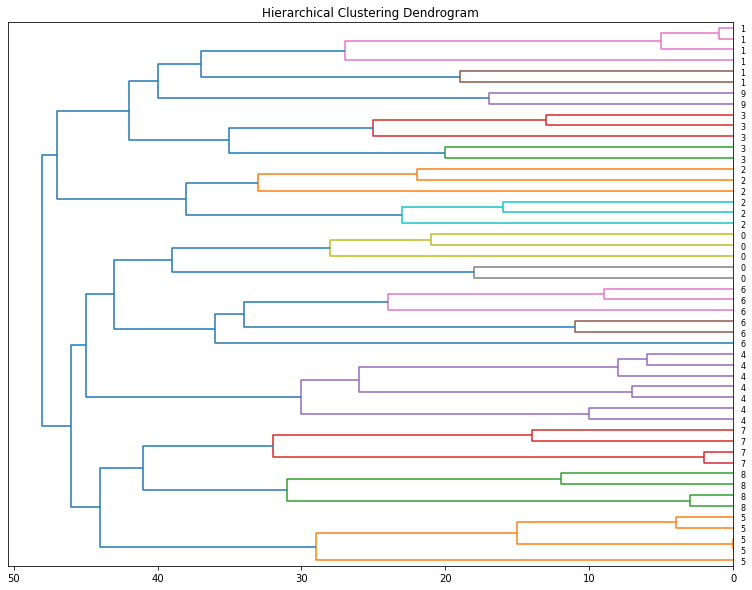

In [26]:
mnist_clust = AgglomerativeClustering(n_clusters=10)
mnist_clust.fit(X_mnist[:50])
plot_dendrogram(mnist_clust)

# Часть 2. Понижение размерности и визуализация многомерных данных

Для отображения вам может быть полезна следующая функция plot_digits

In [27]:
def plot_digits(X, y, predicted_labels, title=None):
    x_min, x_max = np.min(X, 0), np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)

    plt.figure(figsize=(10, 10))
    ax = plt.subplot(111)
    for i in range(X.shape[0]):
        plt.text(X[i, 0], X[i, 1], str(y[i]),
                 color=plt.cm.Set1(predicted_labels[i] / 10.),
                 fontdict={'weight': 'bold', 'size': 9})

    plt.xticks([]), plt.yticks([])
    if title is not None:
        plt.title(title)
    plt.show()

## Задание 2.1 Метод главных компонент

Примените к датасетам метод главных компонент и ответьте на следующие вопросы:
1. Сколько компонент объясняют 95% (99%) дисперсии данных в каждом из случаев?
2. Нарисуйте датасеты один с помощью plot_digits, customers с помощью plt.scatter как в статистике Хопкинса

В каких случаях мощи PCA достаточно для качественной отрисовки данных в 2D, а в каких нет?

In [28]:
from sklearn.decomposition import PCA

In [29]:
pca_mnist = PCA(n_components=64)
pca_mnist.fit(X_mnist)
print(np.sum(pca_mnist.explained_variance_ratio_[:40]))
print(np.sum(pca_mnist.explained_variance_ratio_[:54]))

0.9507791125066463
0.9907660487766967


**Следовательно, 40 компонент объясняют 95% выборки MNIST и 54 компоненты объясняют 99% выборки.**

In [31]:
pca_cust = PCA(n_components=4)
pca_cust.fit(customers)
print(pca_cust.explained_variance_ratio_)
print(np.sum(pca_cust.explained_variance_ratio_[:4]))

[0.4095285  0.3081674  0.20723465 0.07506945]
1.0


**Следовательно, все 4 компоненты (и не меньше) объясняют 95-99% выборки customers**

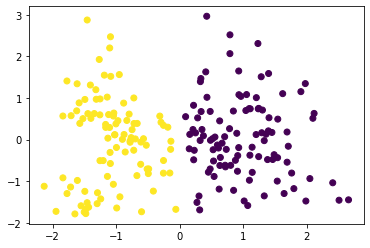

In [49]:
pca = PCA(n_components=2)
X = pca.fit_transform(customers)

y_pred = KMeans(n_clusters=2).fit_predict(customers)

plt.scatter(X[:, 0], X[:, 1], c=y_pred)

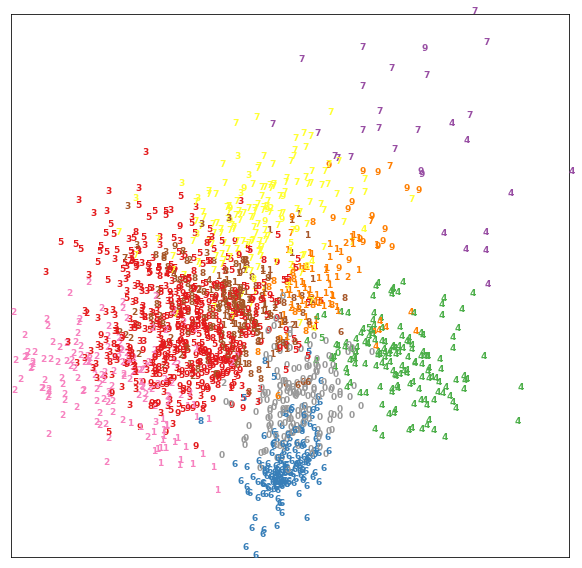

In [50]:
pca = PCA(n_components=2)
X = pca.fit_transform(X_mnist)

y_pred = KMeans(n_clusters=10).fit_predict(X_mnist)

plot_digits(X, y_mnist, y_pred)

## Задание 2.2 t-SNE (Student distributed Stochastic Neighbour Embedding)

Люди, которые ожидают оценку 9, должны немного разобраться в деталях t-SNE и уметь хотя бы на интуитивном уровне рассказать это преподавателю. Если вы претендуете на 8 (зачетная граница), то можно рассматривать t-sne как черный ящик, которому можно крутить параметры perplexity и learning_rate(в материалах можно встретить вариант epsilon).

Источники информации:
1. https://distill.pub/2016/misread-tsne/
2. https://habr.com/ru/post/267041/
3. http://datareview.info/article/algoritm-t-sne-illyustrirovannyiy-vvodnyiy-kurs/

С помощью **!conda install -c conda-forge -y multicore-tsne** установите быструю версию t-sne.

Тут пример использования https://github.com/DmitryUlyanov/Multicore-TSNE


Если вдруг не получится, то используйте TSNE из sklearn. Но лучше, чтобы у вас получилось, так как будет нааааамного быстрее.

Проделайте с t-sne все то, что делали с PCA. Проведите эксперименты с разными значениями перплексии и скорости обучения (прям как в анимации, которую я вам показывал).


**Провести различные эксперименты означает, что тут должно быть несколько рисунков с разными параметрами и какие-то выводы.**

In [33]:
from MulticoreTSNE import MulticoreTSNE

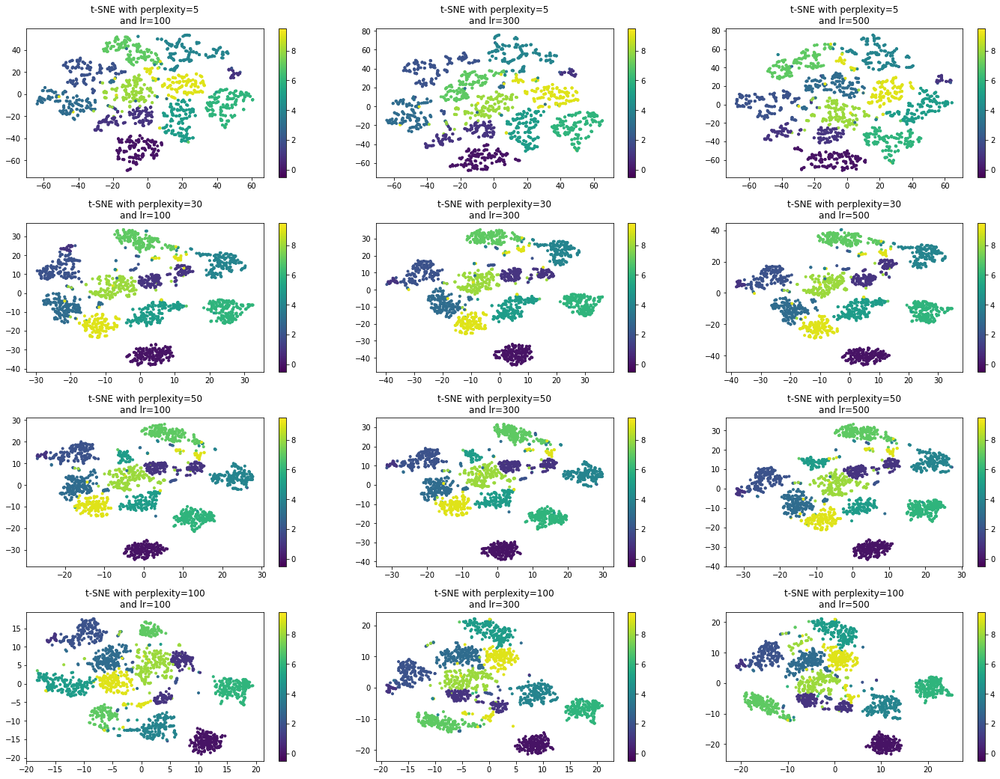

In [71]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))
fig.tight_layout(pad=4)

for row, perp in enumerate([5, 30, 50, 100]):
    for col, lr in enumerate([100, 300, 500]):
        tsne = MulticoreTSNE(perplexity=perp, learning_rate=lr, n_jobs=-1, random_state=42)
        embeddings = tsne.fit_transform(X_mnist)
        vis_x, vis_y = embeddings[:, 0], embeddings[:, 1]

        ax[row, col].set_title(f't-SNE with perplexity={perp}\nand lr={lr}')
        img = ax[row, col].scatter(vis_x, vis_y, c=y_mnist, marker='.')
        fig.colorbar(img, ax=ax[row, col])
        img.set_clim(-0.5, 9.5)

plt.show()

**Как можно видеть, параметр perplexity на конкретно этих данных имеет тенденцию скучковывать данные при его увеличении. Самое оптимальное разбитие данных на группы, как мне кажется, достигается при параметре perplexity=30, потому что при более высоких его значениях данные хорошо разбиваются на группки своих, но также к ним все плотнее прилегают и соседние группы**

**Относительно learning rate я какую-то существенную разницу не заметил, да и в целом, как правило, трудно описать, почему при определенных lr попадание в локальные минимумы происходит быстрее. Для определенности положим оптимальный lr=300.**

## Задание 2.3. Кластеризация после понижения размерности

Используйте любой алгоритм кластеризации на ваш выбор и кластеризуйте данные пониженной размерности с помощью PCA и t-SNE. Сравните качество кластеризации с результатами на исходных датасетах.
Вопросы:
1. Каково значение статистики Хопкинса на данных пониженной размерности
2. Осталось ли таким-же наилучшее число кластеров?
3. В каком случае метрики качества кластеризации выше?


In [73]:
pca_mnist = PCA(n_components=54, random_state=42)
tsne = MulticoreTSNE(perplexity=30, learning_rate=300, n_jobs=-1, random_state=42)

X_mnist_pca = pca_mnist.fit_transform(X_mnist)
X_mnist_tsne = tsne.fit_transform(X_mnist)

print(f'Hopkins statistic for PCA: {hopkins_statistic(X_mnist_pca, 1)}')
print(f'Hopkins statistic for t-SNE: {hopkins_statistic(X_mnist_tsne, 1)}')

Hopkins statistic for PCA: 0.4843346231935246
Hopkins statistic for t-SNE: 0.19911792208568146


**Данные MNIST после t-SNE преобразования имеют очень хорошую кластерную структуру.**

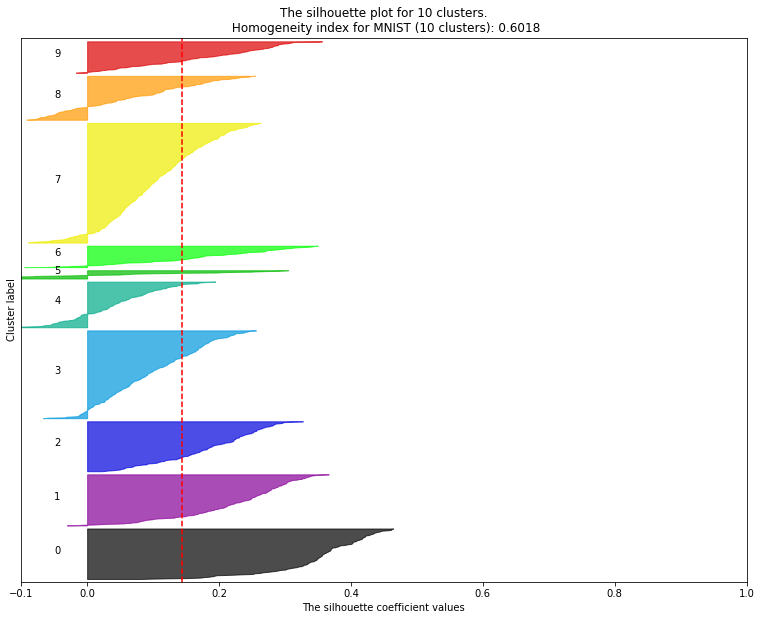

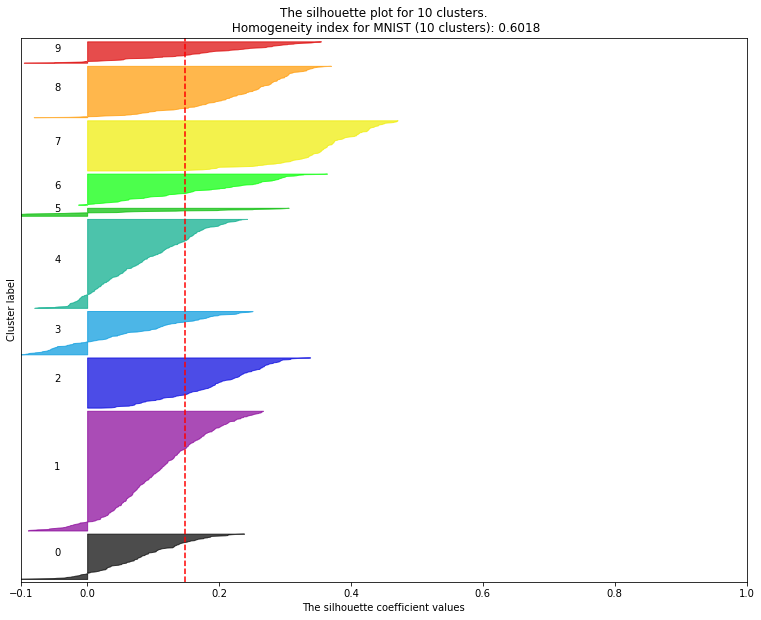

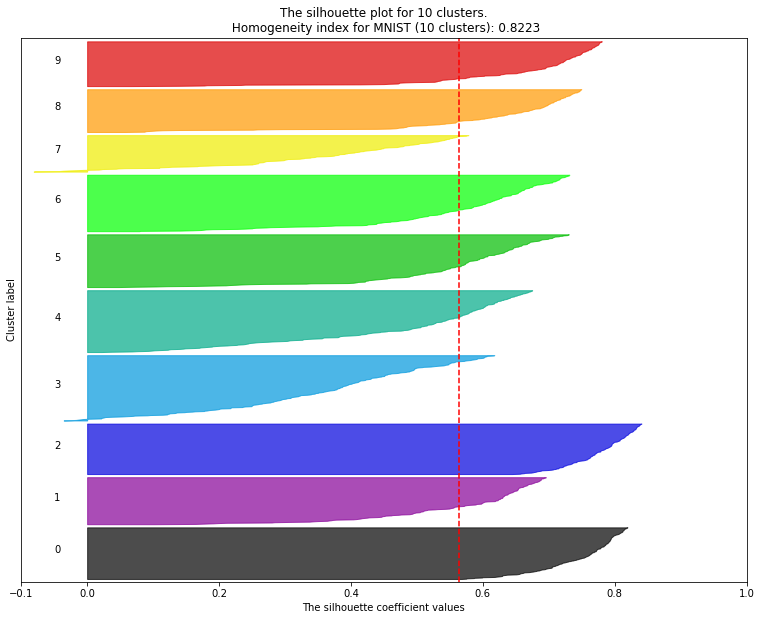

In [84]:
plot_silhouette(X_mnist, 10, y_mnist)
plot_silhouette(X_mnist_pca, 10, y_mnist)
plot_silhouette(X_mnist_tsne, 10, y_mnist)

## Переберем число кластеров

### Для PCA

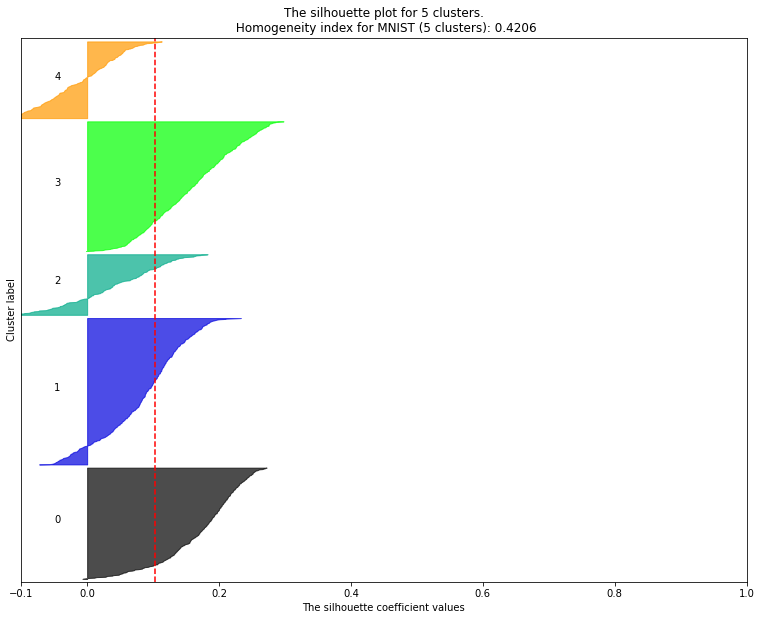

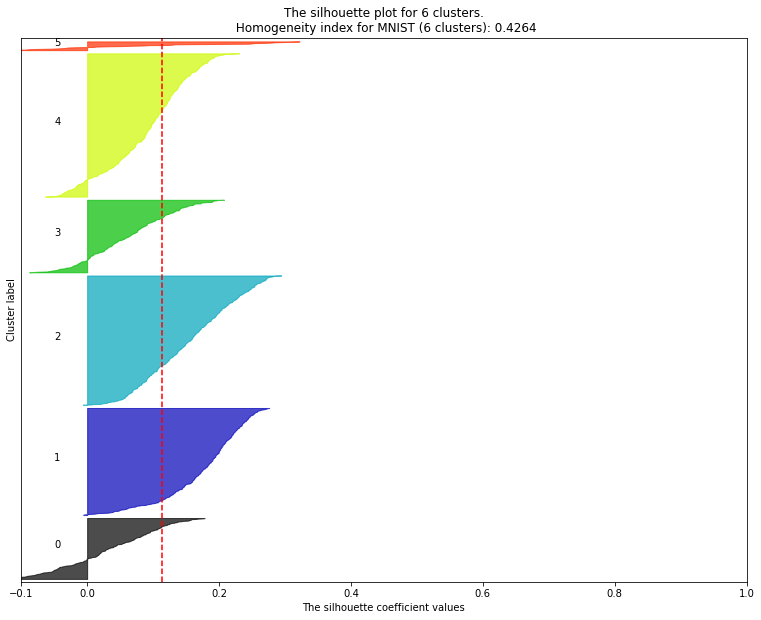

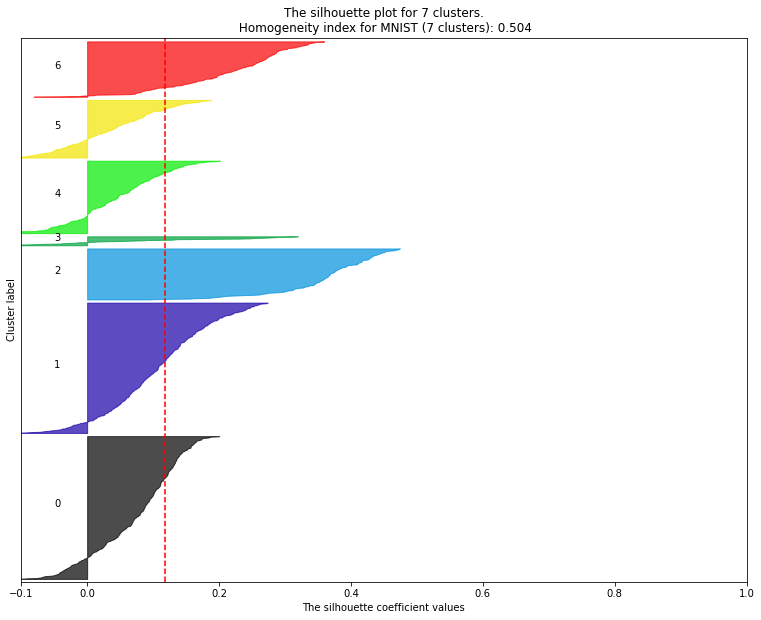

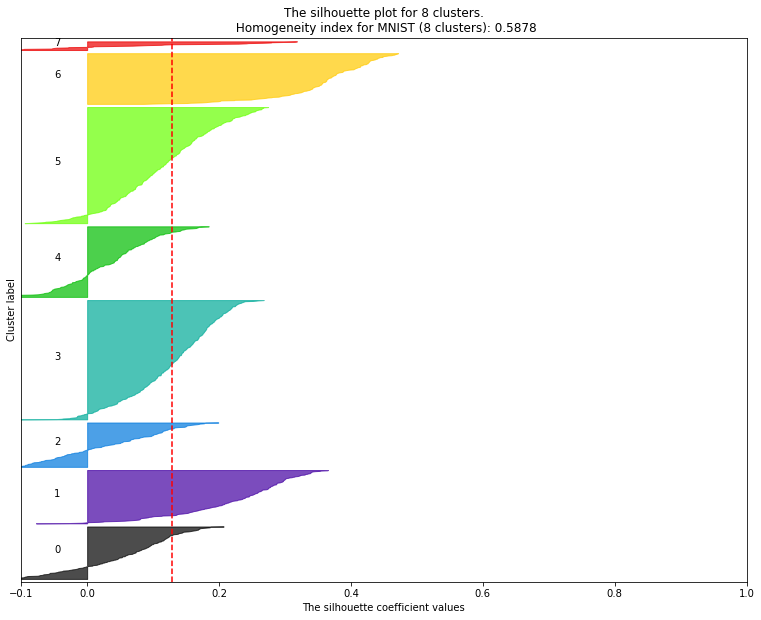

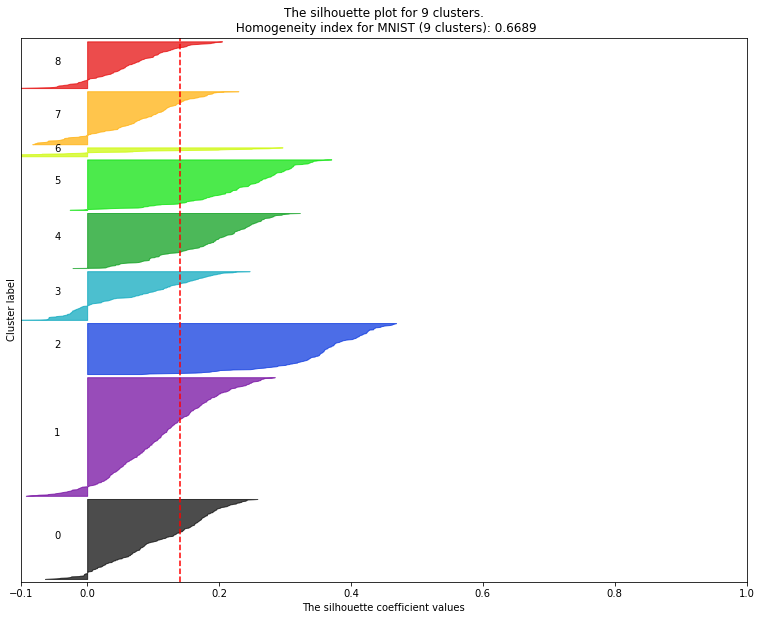

...

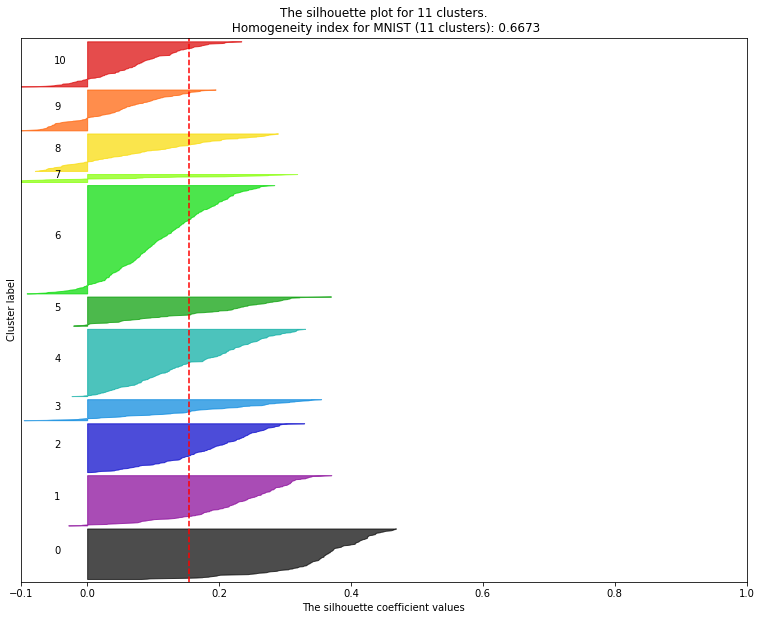

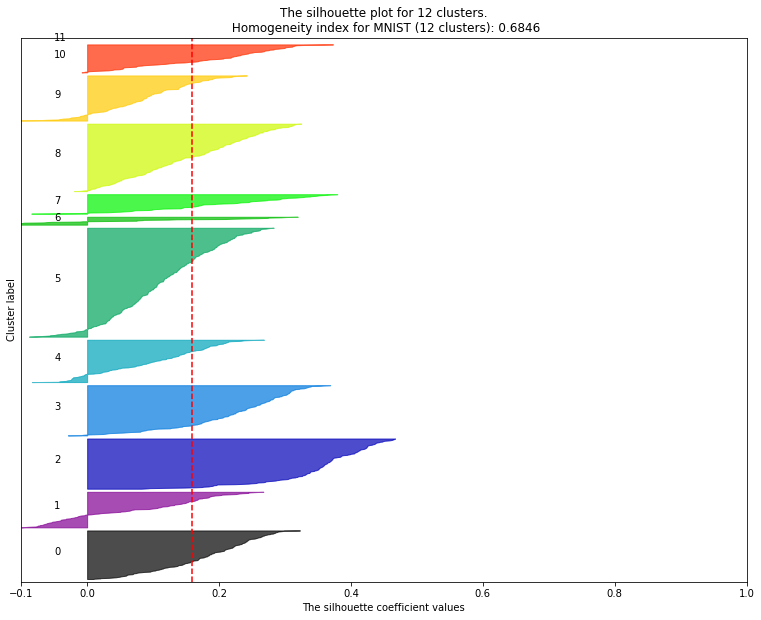

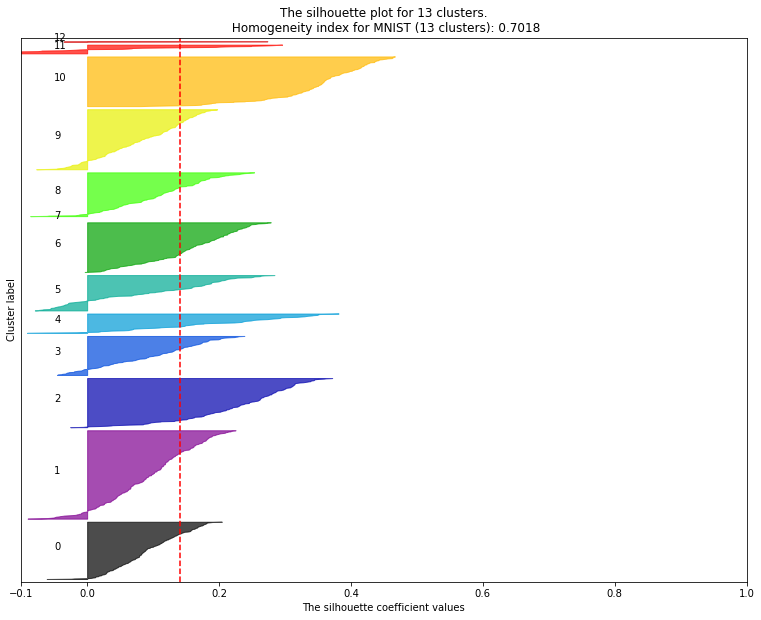

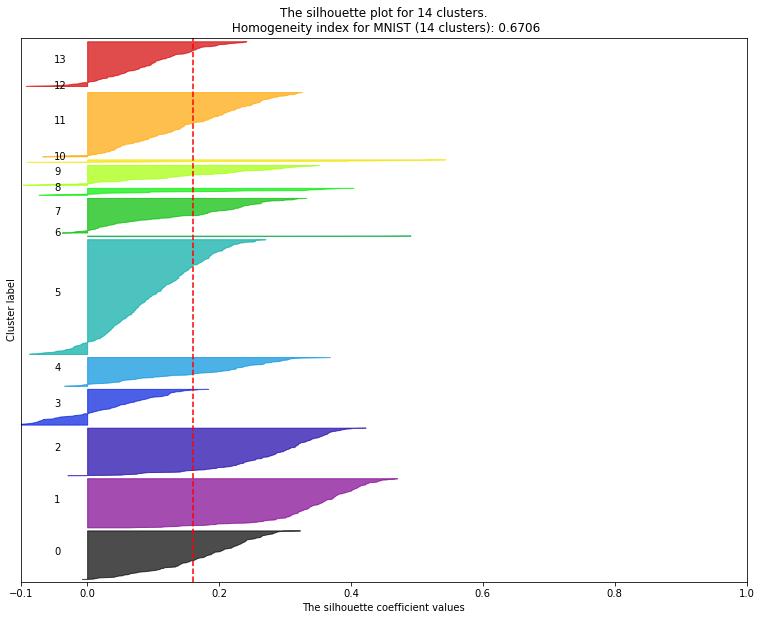

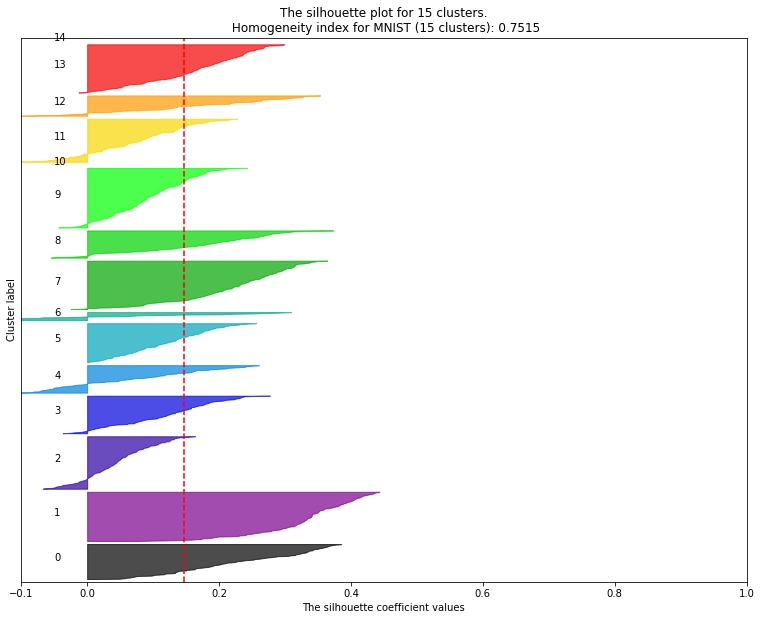

In [85]:
for nclust in range(5, 16):
    plot_silhouette(X_mnist_pca, nclust, y_mnist)

### Для t-SNE

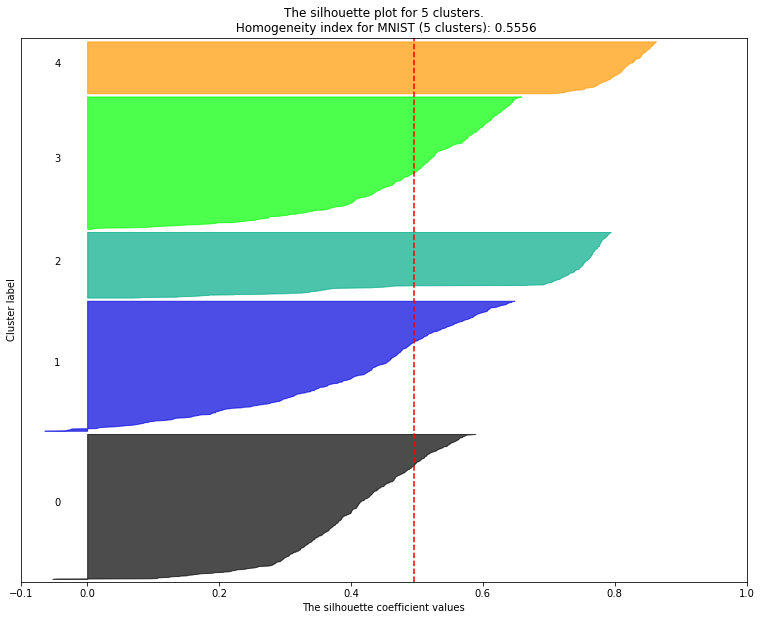

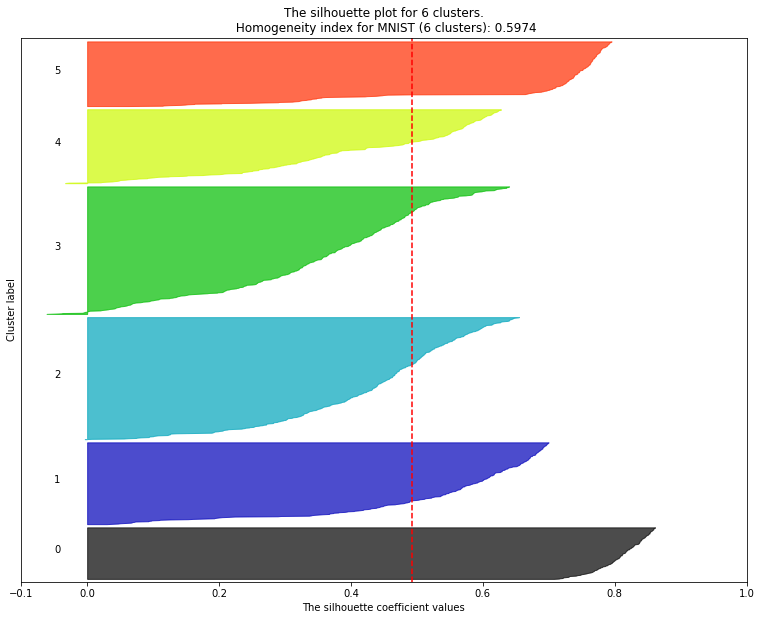

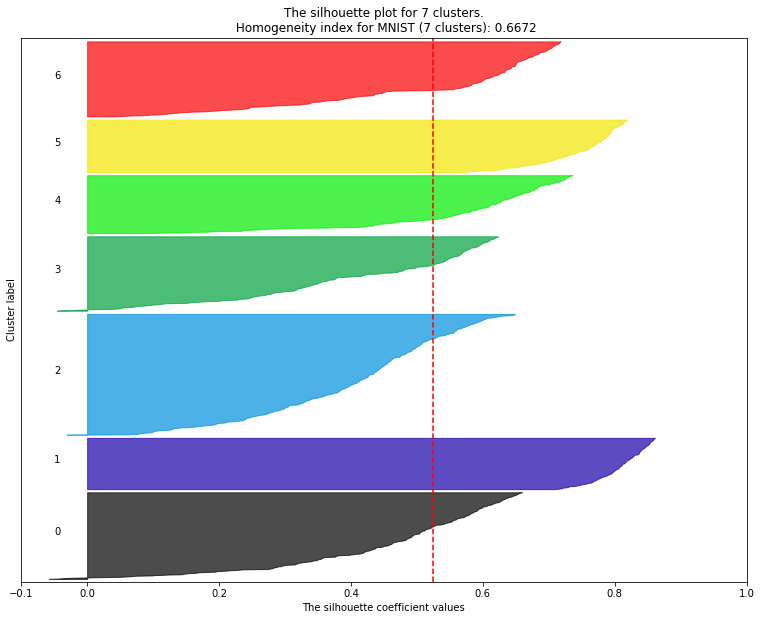

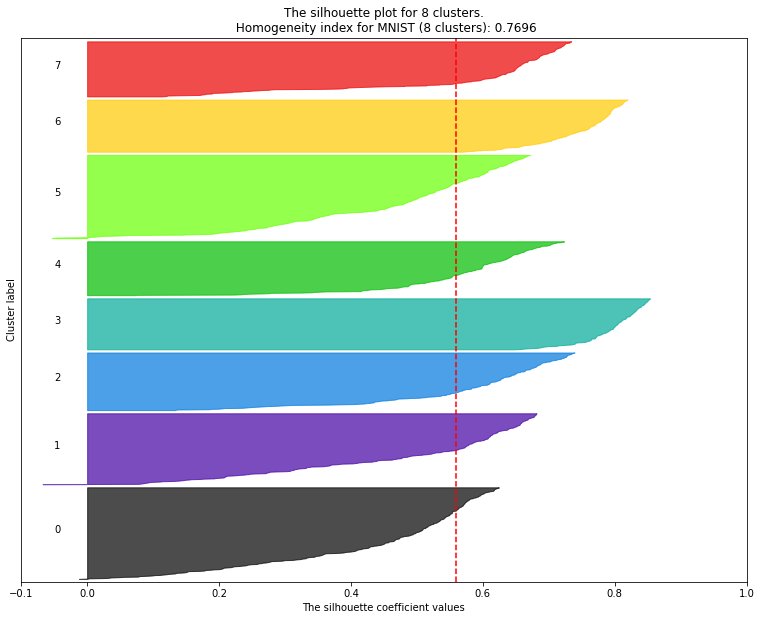

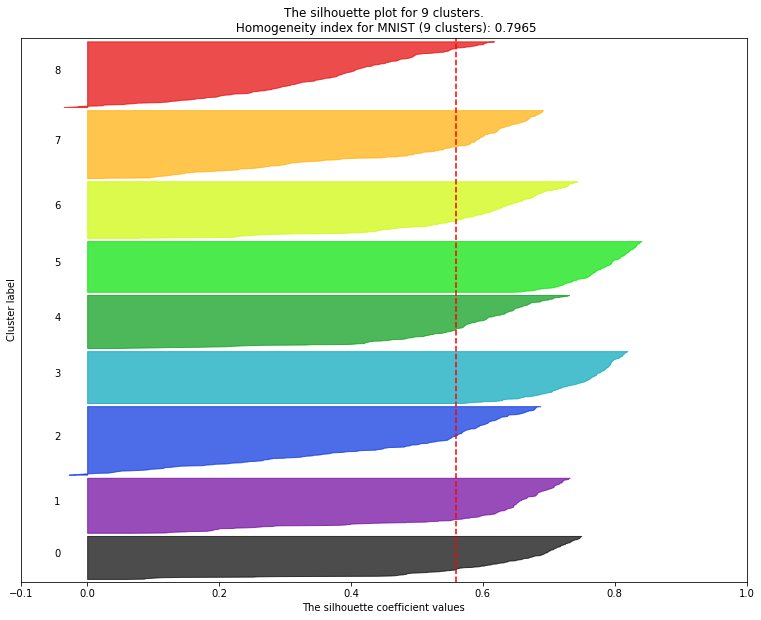

...

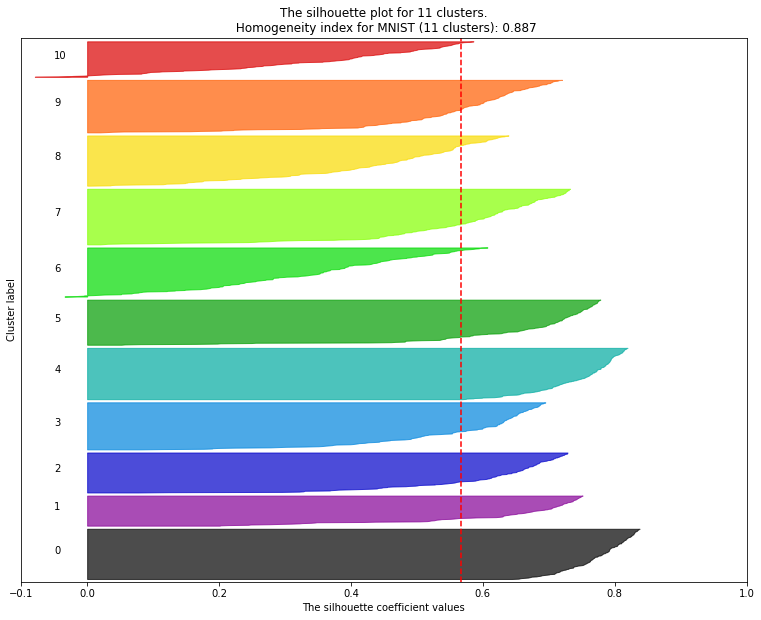

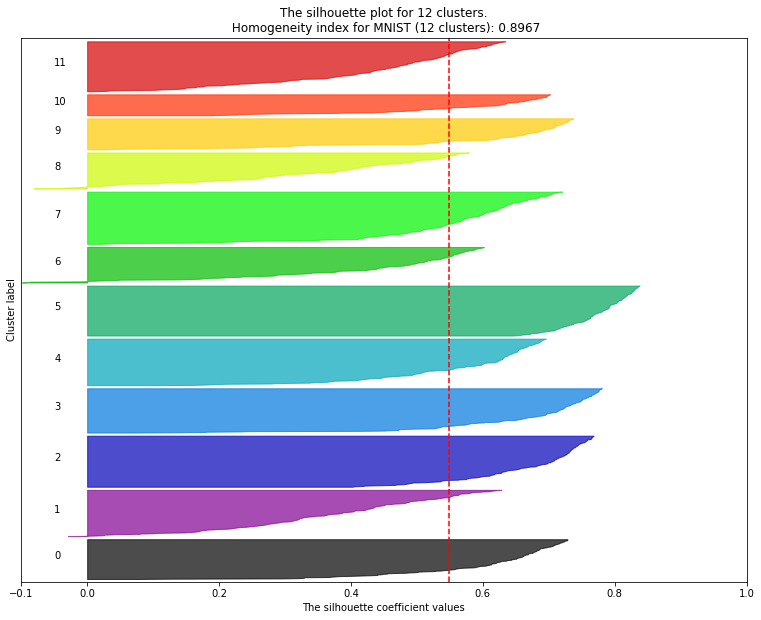

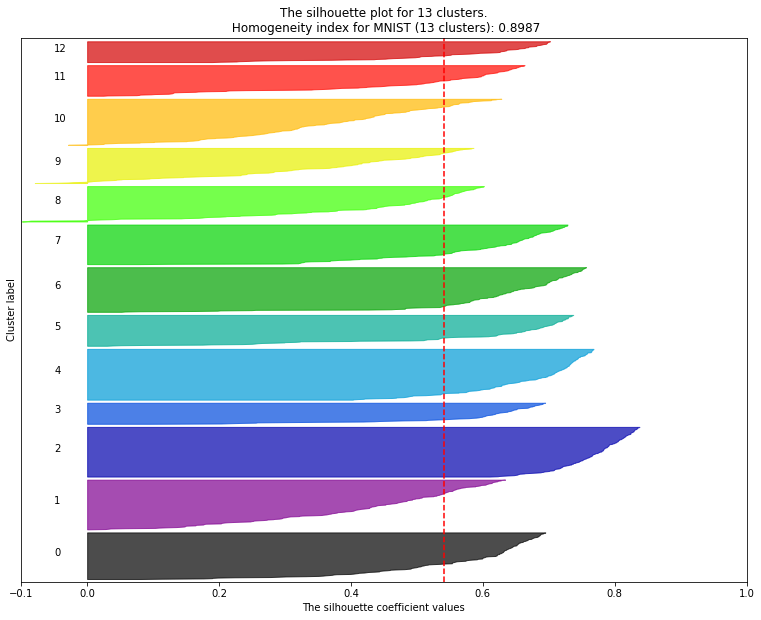

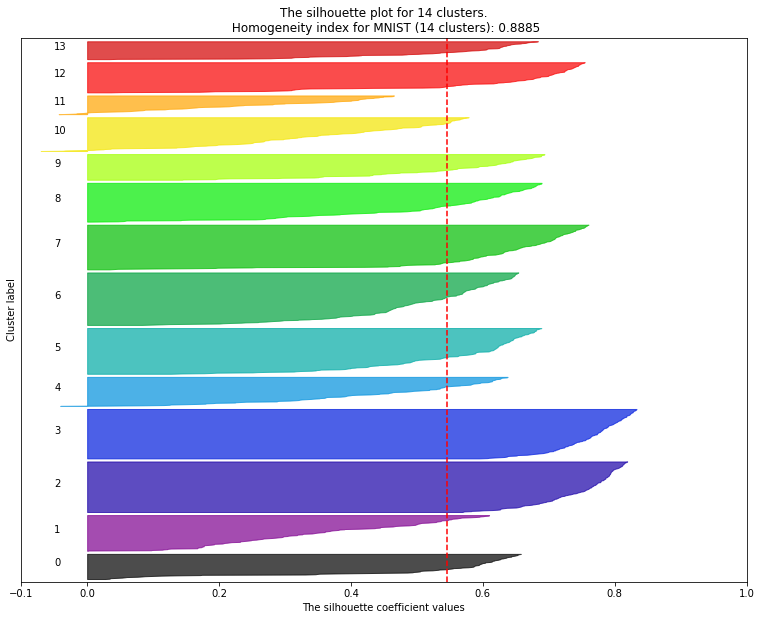

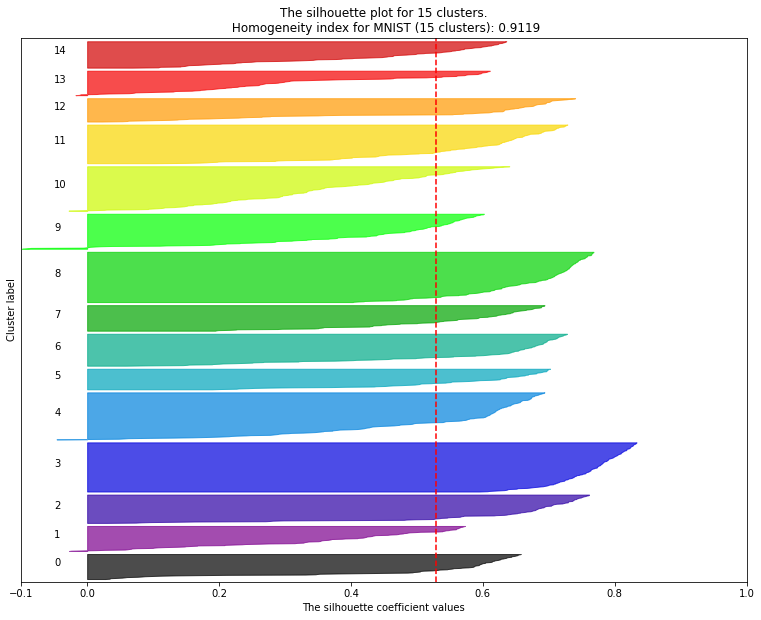

In [86]:
for nclust in range(5, 16):
    plot_silhouette(X_mnist_tsne, nclust, y_mnist)

**Как можно видеть, при помощи нелинейного преобразования признаков кластериция осуществляется куда точнее, чем это было с обычными данными или с их линейным понижением**

# Задание 3 (первый вариант на 10). Реализация и анимация k-means

В этом задании вам предлагается реализовать метод кластеризации k-средних и снять на его основе короткометражный документальный фильм при помощи библиотеки **moviepy**. Все, что вам нужно - это получить "кадры" каждого шага метода и запустить соответствующую функцию. В конце нужно продемонстрировать процесс генерации и сам фильм преподавателю.

# Задание 4 (Второй вариант на 10. Сложнее). Ансамблировние алгоритмов кластеризации

За время выполнения лабораторной работы у вас получилось по крайней мере две кластеризации. Возникает логичный вопрос: а можем ли мы составить ансамбль из кластеризаций похоже на ансамбль supervised моделей?

В рамках этого размытого и творческого задания вам предлагается подумать о вариантах (или их нагуглить) и реализовать для комбинации k-means и иерархической кластеризации.

**Hint**. Ключевые слова clustering ensemble, consensus clustering